___

<a href='http://www.pieriandata.com'><img src='../Pierian_Data_Logo.png'/></a>
___
<center><em>Copyright by Pierian Data Inc.</em></center>
<center><em>For more information, visit us at <a href='http://www.pieriandata.com'>www.pieriandata.com</a></em></center>

# DBSCAN Hyperparameters


Let's explore the hyperparameters for DBSCAN and how they can change results!

## DBSCAN and Clustering Examples

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

In [2]:
def Std_Vis_Plot():
    fig, ax = plt.subplots(figsize=(10, 6),dpi=650)
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))
    ax.grid(which='minor', color='black',alpha=0.15, linestyle='--')
    ax.grid(which='major', color='black',alpha=0.33, linestyle='--')

In [3]:
two_blobs = pd.read_csv('../DATA/cluster_two_blobs.csv')
two_blobs_outliers = pd.read_csv('../DATA/cluster_two_blobs_outliers.csv')

<AxesSubplot:xlabel='X1', ylabel='X2'>

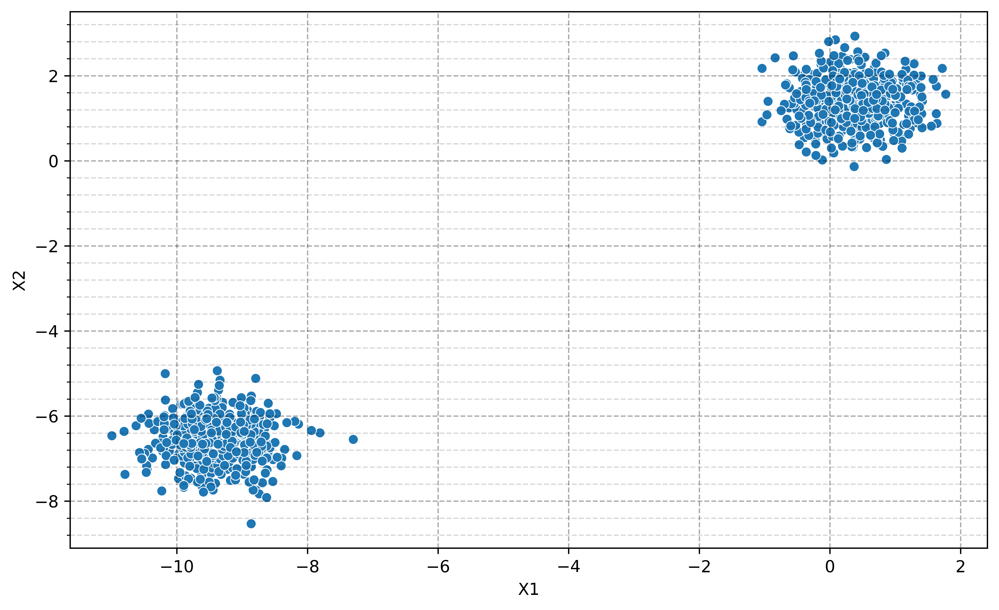

In [4]:
Std_Vis_Plot()
sns.scatterplot(data=two_blobs,x='X1',y='X2',palette='viridis')

<AxesSubplot:xlabel='X1', ylabel='X2'>

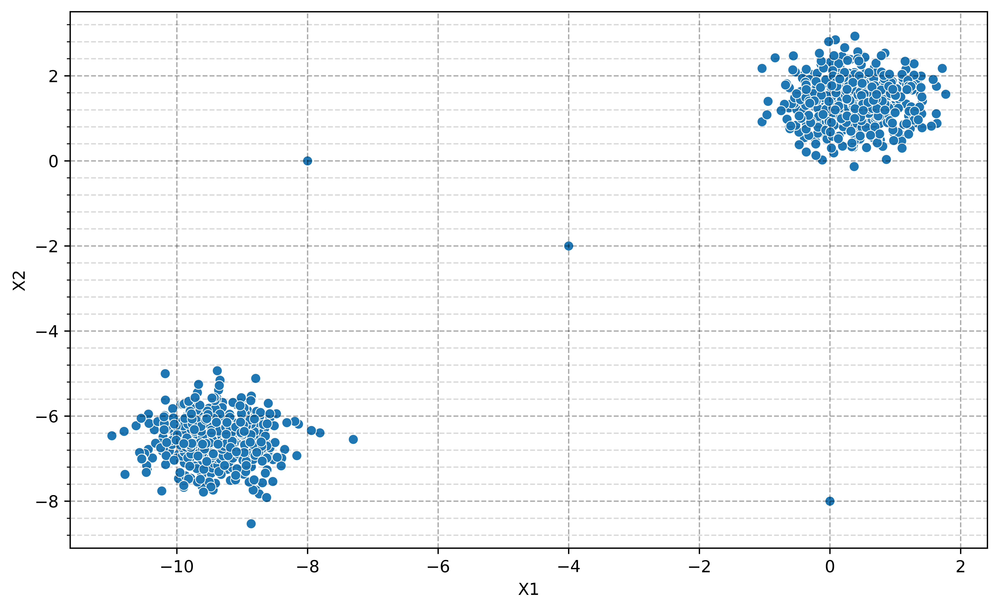

In [5]:
# plt.figure(figsize=(10,6),dpi=200)
Std_Vis_Plot()
sns.scatterplot(data=two_blobs_outliers,x='X1',y='X2',palette='viridis')

## Label Discovery

In [6]:
def display_categories(model,data):
    labels = model.fit_predict(data)
    sns.scatterplot(data=data,x='X1',y='X2',hue=labels,palette='viridis')

## DBSCAN

In [7]:
from sklearn.cluster import DBSCAN

In [8]:
help(DBSCAN)

Help on class DBSCAN in module sklearn.cluster._dbscan:

class DBSCAN(sklearn.base.ClusterMixin, sklearn.base.BaseEstimator)
 |  DBSCAN(eps=0.5, *, min_samples=5, metric='euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None)
 |  
 |  Perform DBSCAN clustering from vector array or distance matrix.
 |  
 |  DBSCAN - Density-Based Spatial Clustering of Applications with Noise.
 |  Finds core samples of high density and expands clusters from them.
 |  Good for data which contains clusters of similar density.
 |  
 |  Read more in the :ref:`User Guide <dbscan>`.
 |  
 |  Parameters
 |  ----------
 |  eps : float, default=0.5
 |      The maximum distance between two samples for one to be considered
 |      as in the neighborhood of the other. This is not a maximum bound
 |      on the distances of points within a cluster. This is the most
 |      important DBSCAN parameter to choose appropriately for your data set
 |      and distance function.
 |  
 |  min_sam

In [9]:
dbscan = DBSCAN()

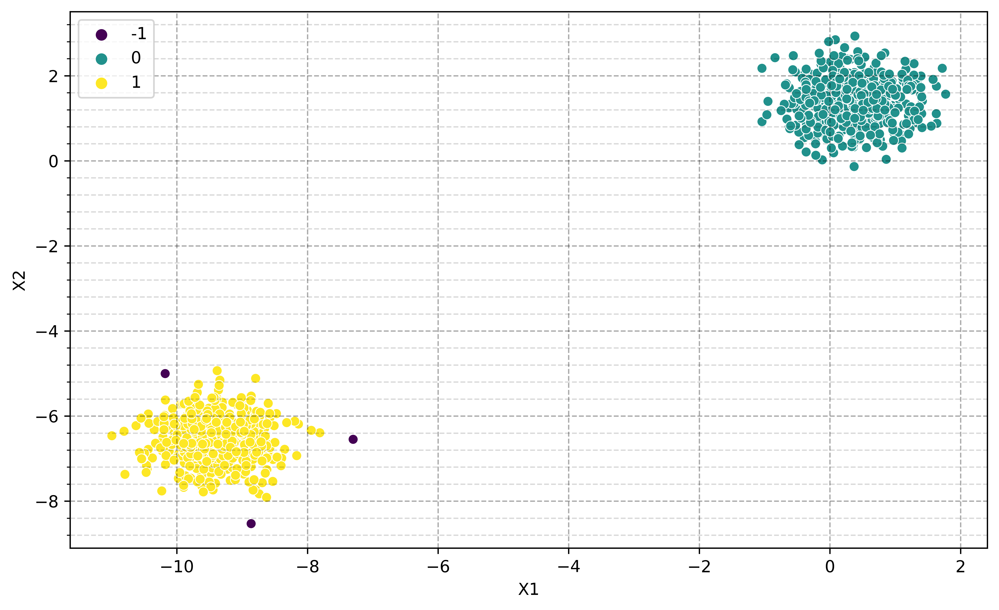

In [10]:
Std_Vis_Plot()
display_categories(dbscan,two_blobs)

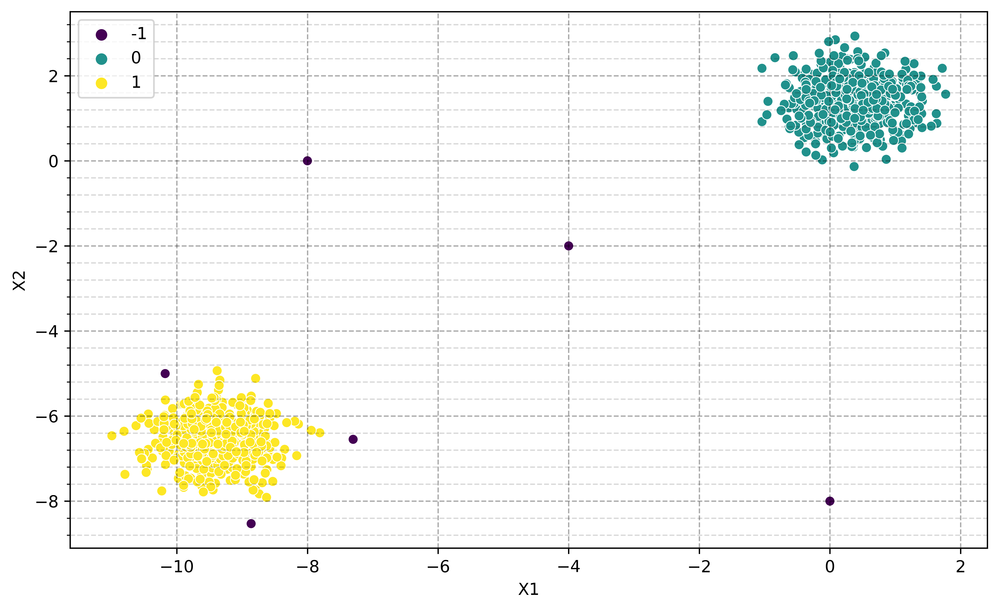

In [11]:
Std_Vis_Plot()
display_categories(dbscan,two_blobs_outliers)

# Epsilon

    eps : float, default=0.5
     |      The maximum distance between two samples for one to be considered
     |      as in the neighborhood of the other. This is not a maximum bound
     |      on the distances of points within a cluster. This is the most
     |      important DBSCAN parameter to choose appropriately for your data set
     |      and distance function.

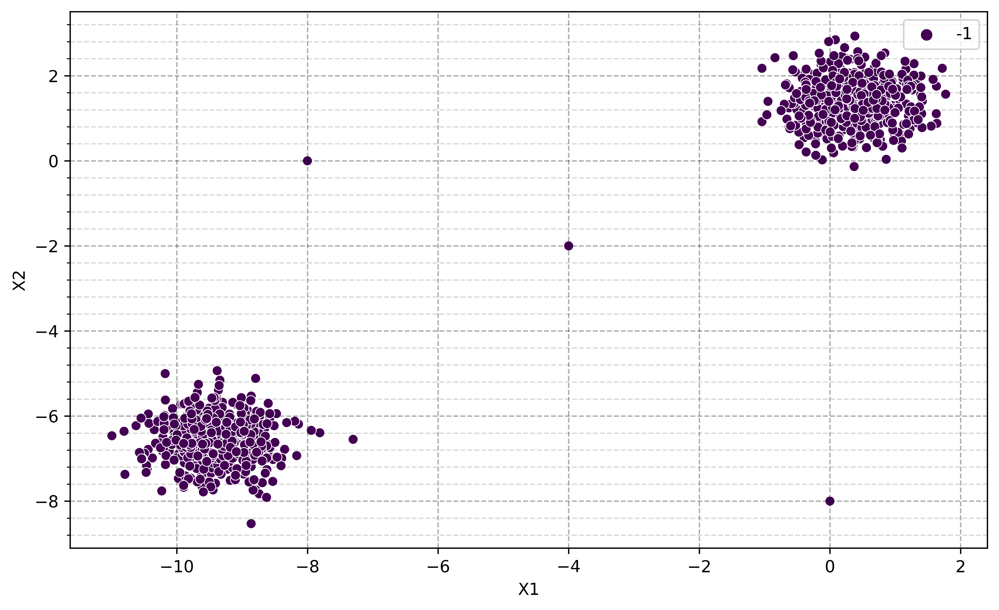

In [12]:
# Tiny Epsilon --> Tiny Max Distance --> Everything is an outlier (class=-1)
Std_Vis_Plot()
dbscan = DBSCAN(eps=0.001)
display_categories(dbscan,two_blobs_outliers)

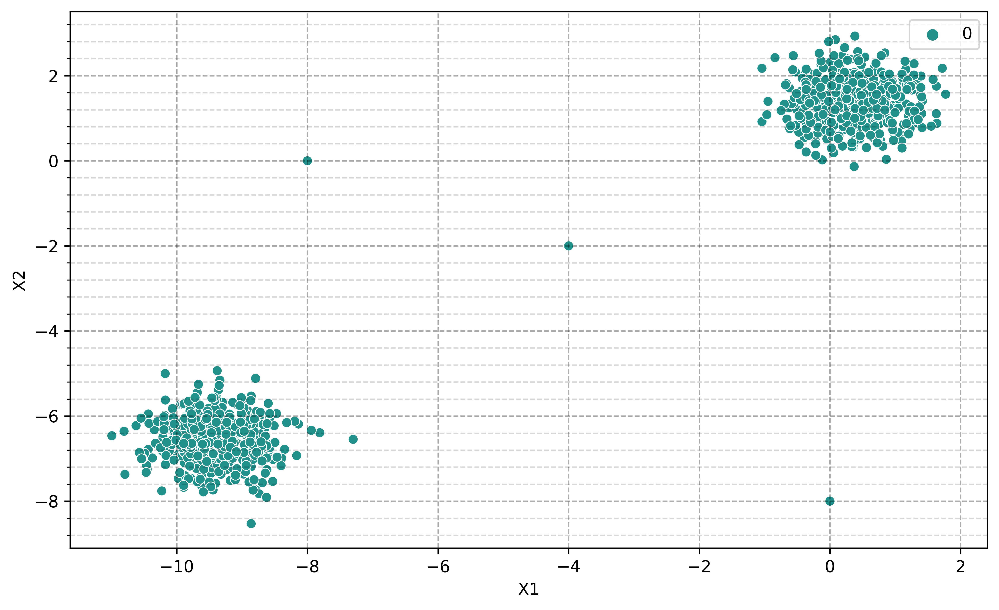

In [13]:
# Huge Epsilon --> Huge Max Distance --> Everything is in the same cluster (class=0)
Std_Vis_Plot()
dbscan = DBSCAN(eps=10)
display_categories(dbscan,two_blobs_outliers)

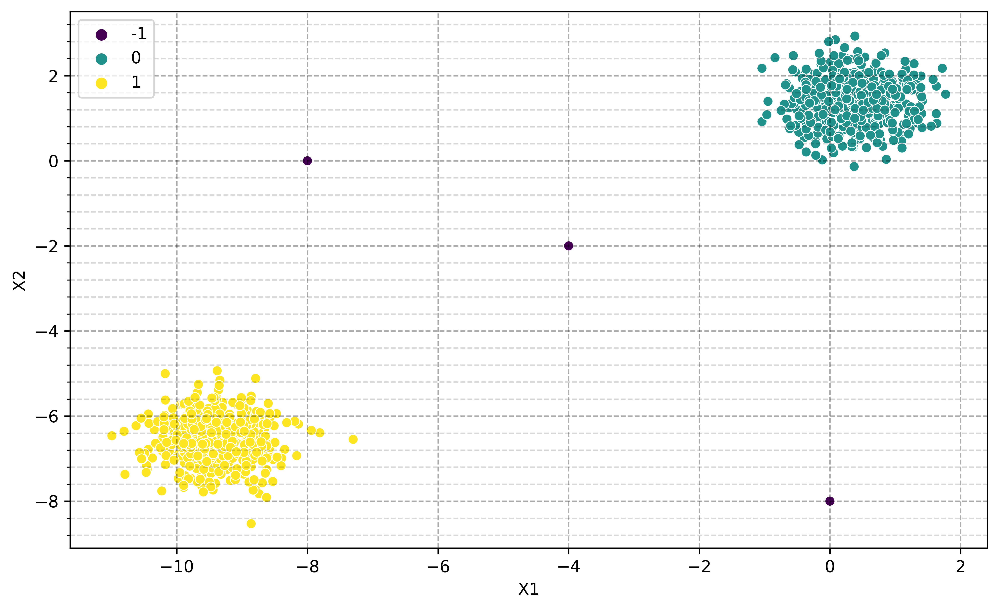

In [14]:
# How to find a good epsilon?
Std_Vis_Plot()
dbscan = DBSCAN(eps=1)
display_categories(dbscan,two_blobs_outliers)

In [15]:
dbscan.labels_

array([ 0,  1,  0, ..., -1, -1, -1], dtype=int64)

In [16]:
dbscan.labels_ == -1

array([False, False, False, ...,  True,  True,  True])

In [17]:
np.sum(dbscan.labels_ == -1) #Number of outliers

3

In [18]:
len(dbscan.labels_)

1003

In [19]:
print(f'Percentage of outliers = {np.round(100 * np.sum(dbscan.labels_ == -1) / len(dbscan.labels_),decimals=5)} %') #Percentage of outliers 

Percentage of outliers = 0.2991 %


## Charting reasonable Epsilon values

In [20]:
list_of_numbers=np.arange(start=0.01,stop=10,step=0.01)

In [21]:
outlier_percent = []
number_of_outliers = []

for eps in list_of_numbers:
    
    # Create Model
    dbscan = DBSCAN(eps=eps)
    dbscan.fit(two_blobs_outliers)
    
    # Log Number of Outliers
    number_of_outliers.append(np.sum(dbscan.labels_ == -1))
    
    # Log percentage of points that are outliers
    perc_outliers = 100 * np.sum(dbscan.labels_ == -1) / len(dbscan.labels_)
    
    outlier_percent.append(perc_outliers)
    

Text(0.5, 0, 'Epsilon Value')

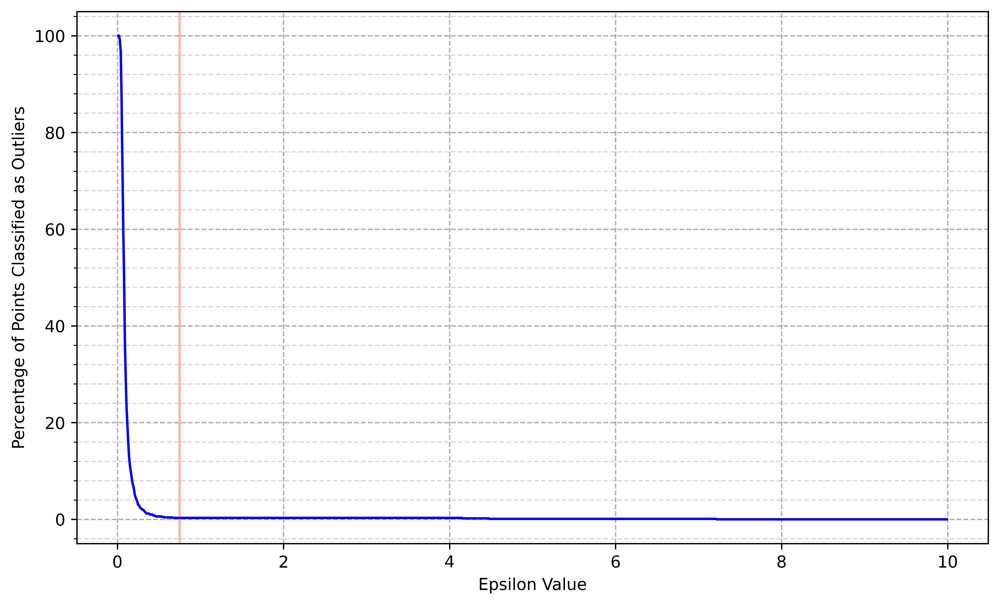

In [22]:
Std_Vis_Plot()
sns.lineplot(x=list_of_numbers,y=outlier_percent,color='blue')
plt.ylabel("Percentage of Points Classified as Outliers")
plt.axvline(x=0.75, color = 'r',alpha=0.3)
plt.xlabel("Epsilon Value")

(0.0, 1.0)

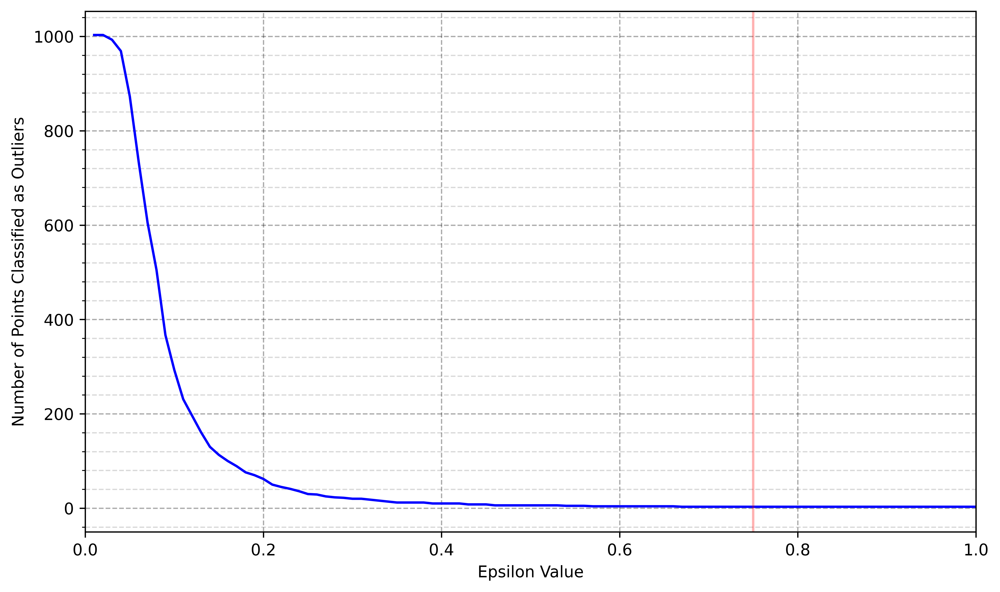

In [23]:
Std_Vis_Plot()
sns.lineplot(x=list_of_numbers,y=number_of_outliers,color='blue')
plt.ylabel("Number of Points Classified as Outliers")
plt.xlabel("Epsilon Value")
plt.axvline(x=0.75, color = 'r',alpha=0.3)
plt.xlim(0,1)

### Do we want to think in terms of percentage targeting instead?

If so, you could "target" a percentage, like choose a range producing 1%-5% as outliers.

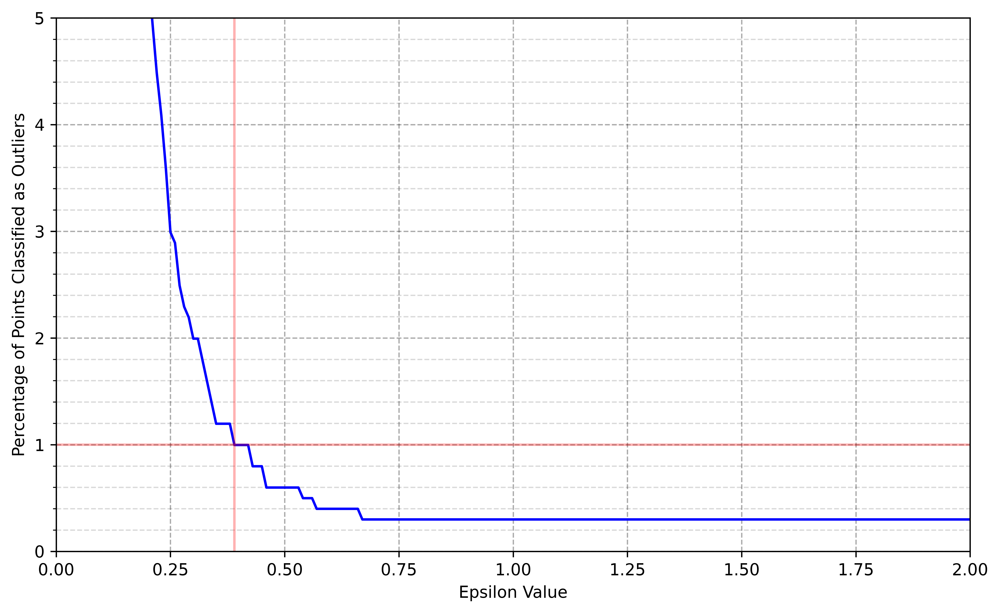

In [36]:
Std_Vis_Plot()
sns.lineplot(x=list_of_numbers,y=outlier_percent,color='blue')
plt.ylabel("Percentage of Points Classified as Outliers")
plt.xlabel("Epsilon Value")
plt.ylim(0,5)
plt.xlim(0,2)
plt.axvline(x=0.39, color = 'r',alpha=0.3)
plt.axhline(y=1, color = 'r',alpha=0.3)

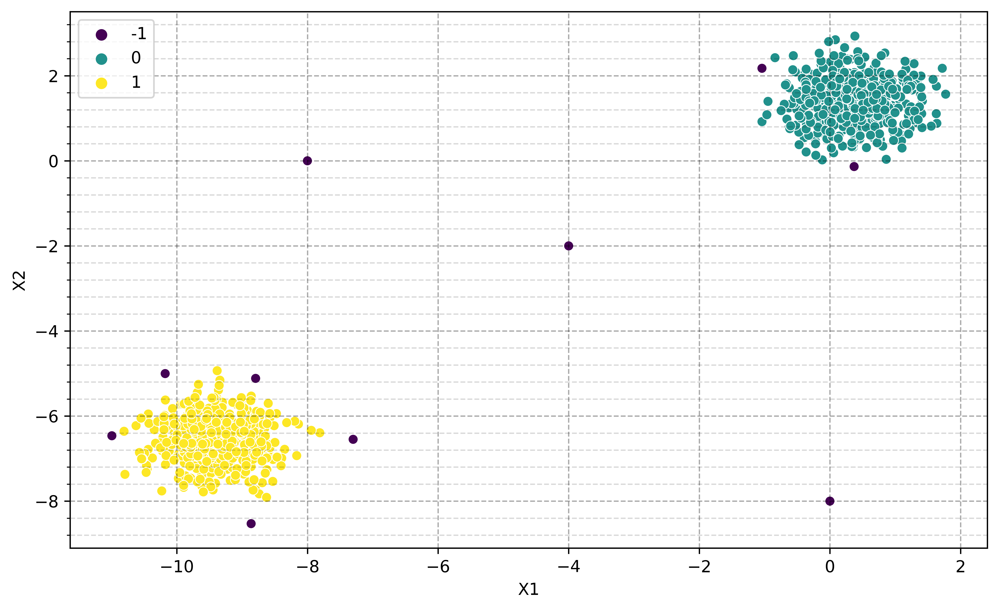

In [25]:
# How to find a good epsilon?
Std_Vis_Plot()
dbscan = DBSCAN(eps=0.4)
display_categories(dbscan,two_blobs_outliers)

### Do we want to think in terms of number of outliers targeting instead?

If so, you could "target" a number of outliers, such as 3 points as outliers.

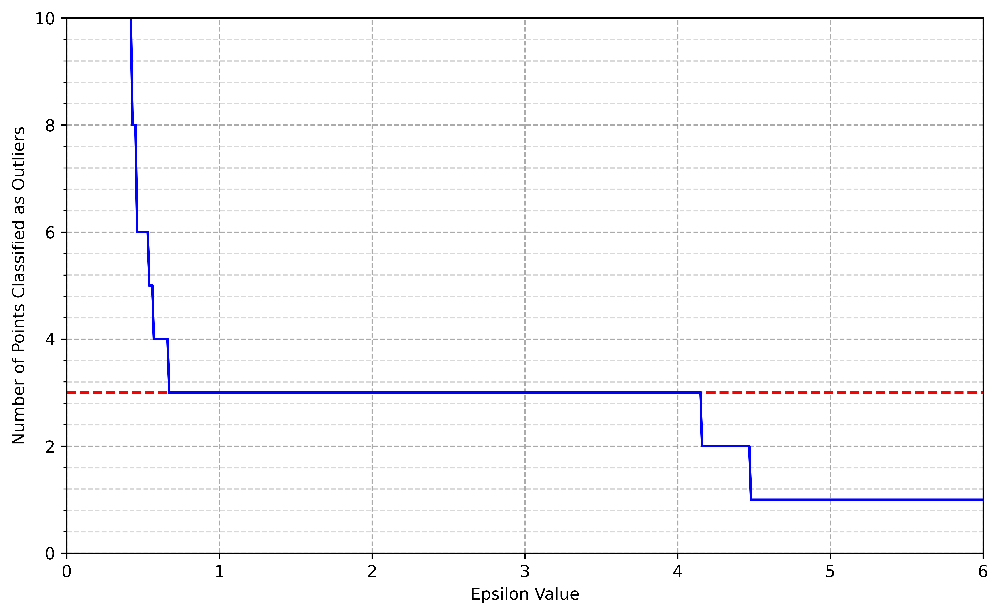

In [26]:
Std_Vis_Plot()
sns.lineplot(x=list_of_numbers,y=number_of_outliers,color='blue')
plt.ylabel("Number of Points Classified as Outliers")
plt.xlabel("Epsilon Value")
plt.ylim(0,10)
plt.xlim(0,6)
plt.hlines(y=3,xmin=0,xmax=10,colors='red',ls='--')

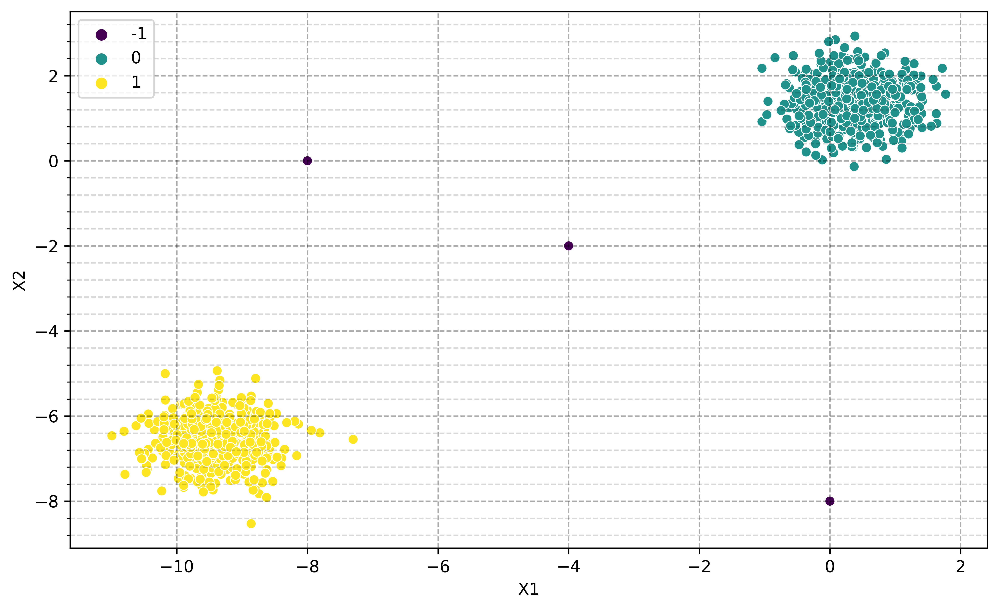

In [27]:
# How to find a good epsilon?
Std_Vis_Plot()
dbscan = DBSCAN(eps=0.75)
display_categories(dbscan,two_blobs_outliers)

## Minimum Samples

     |  min_samples : int, default=5
     |      The number of samples (or total weight) in a neighborhood for a point
     |      to be considered as a core point. This includes the point itself.
     

How to choose minimum number of points?

https://stats.stackexchange.com/questions/88872/a-routine-to-choose-eps-and-minpts-for-dbscan

In [28]:
second_list_of_numbers=np.arange(1,100,step=1)

In [29]:
second_outlier_percent = []

for n in second_list_of_numbers:
    
    # Create Model
    dbscan = DBSCAN(min_samples=n)
    dbscan.fit(two_blobs_outliers)
    # Log percentage of points that are outliers
    perc_outliers = 100 * np.sum(dbscan.labels_ == -1) / len(dbscan.labels_)
    second_outlier_percent.append(perc_outliers)
    

Text(0.5, 0, 'Minimum Number of Samples')

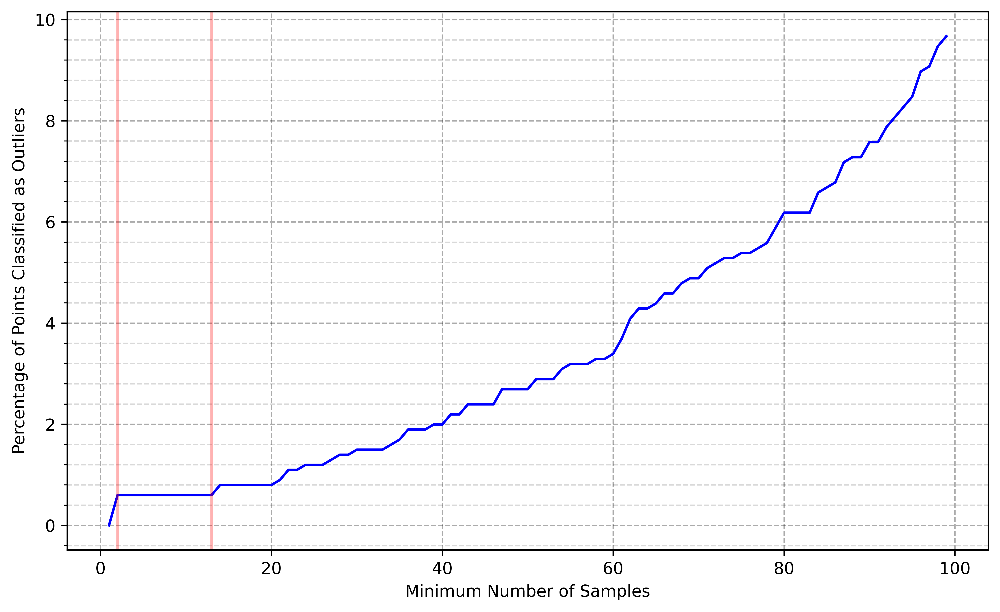

In [30]:
Std_Vis_Plot()
sns.lineplot(x=second_list_of_numbers,y=second_outlier_percent,color='blue')
plt.axvline(x =2, color = 'r',alpha=0.3)
plt.axvline(x =13, color = 'r',alpha=0.3)
plt.ylabel("Percentage of Points Classified as Outliers")
plt.xlabel("Minimum Number of Samples")

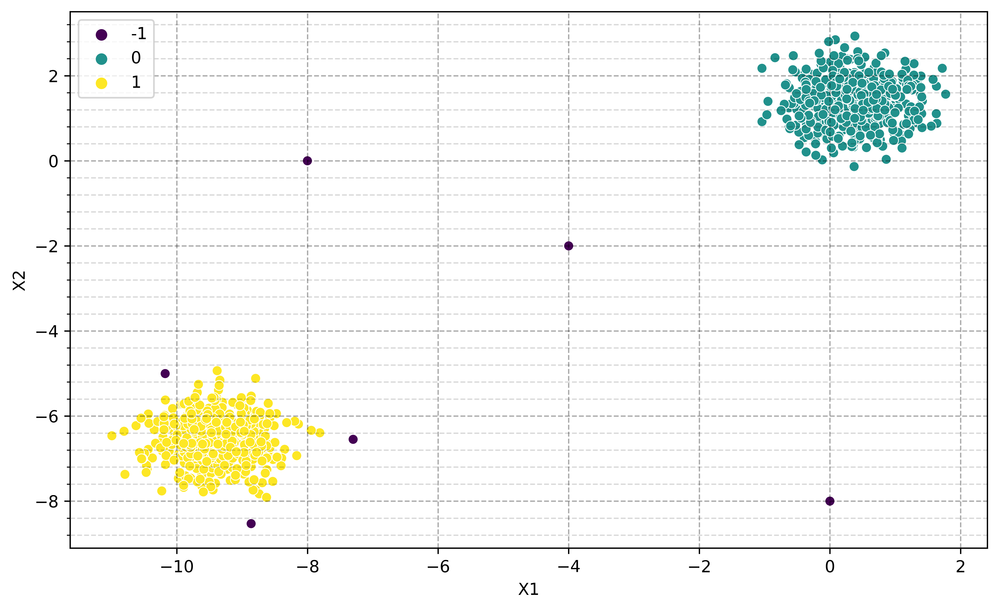

In [31]:
Std_Vis_Plot()
num_dim = two_blobs_outliers.shape[1]
dbscan = DBSCAN(min_samples=2*num_dim)
display_categories(dbscan,two_blobs_outliers)

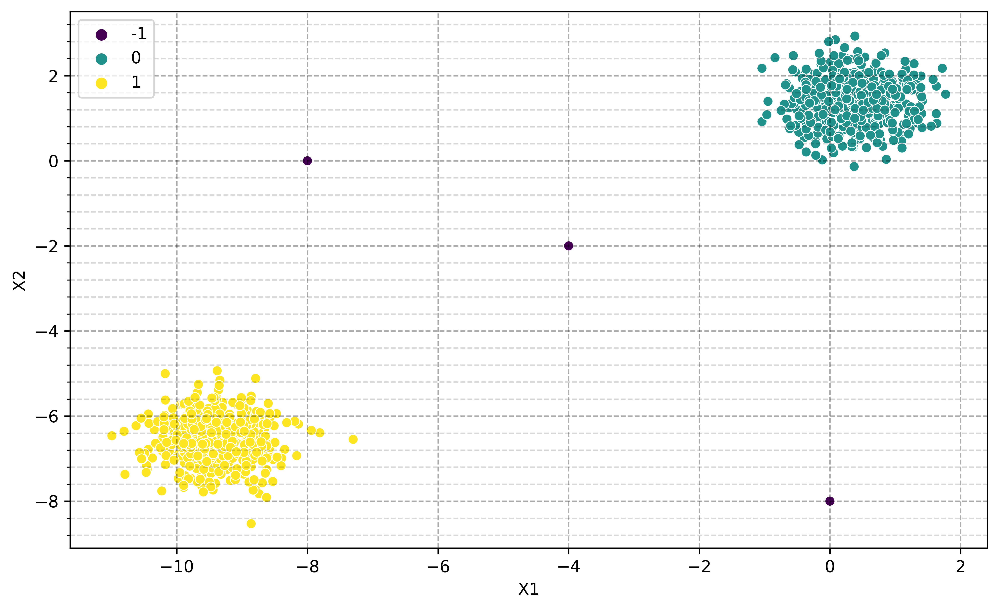

In [32]:
Std_Vis_Plot()
num_dim = two_blobs_outliers.shape[1]
dbscan = DBSCAN(eps=0.75,min_samples=2*num_dim)
display_categories(dbscan,two_blobs_outliers)

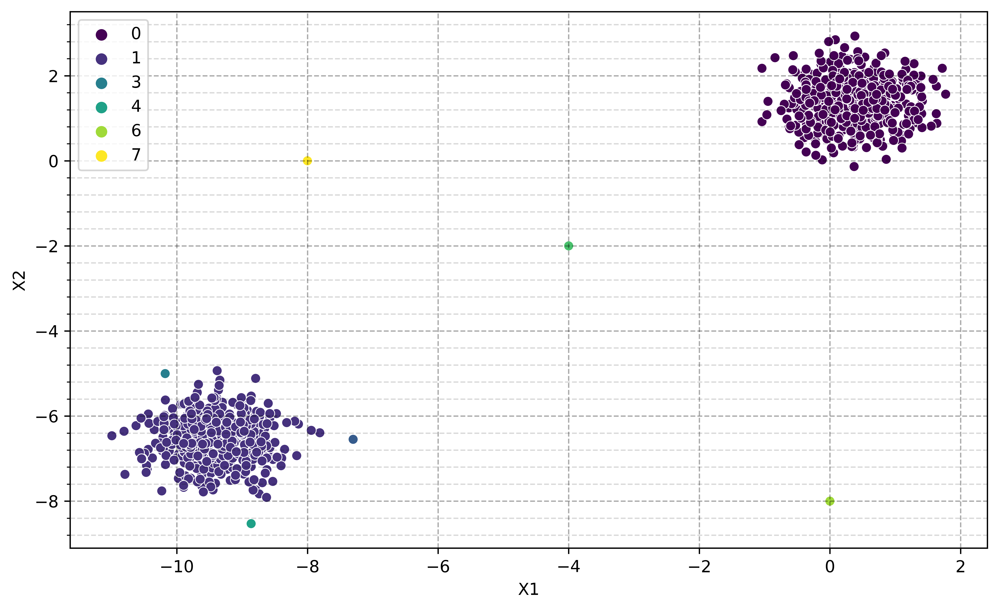

In [33]:
Std_Vis_Plot()
dbscan = DBSCAN(min_samples=1)
display_categories(dbscan,two_blobs_outliers)

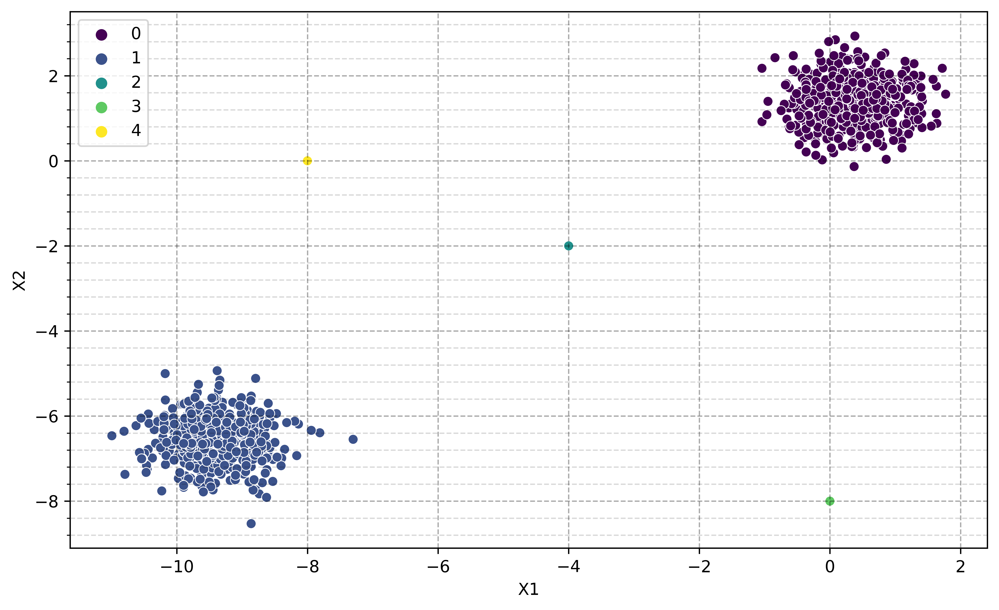

In [34]:
Std_Vis_Plot()
dbscan = DBSCAN(eps=0.75,min_samples=1)
display_categories(dbscan,two_blobs_outliers)

----